This notebook will help you analyze the monogamy of mutual information condition for all qubit triplets and concurrence/mutual information between all qubit pairs on the network as a function of time

In [1]:
# Add directory above current directory to path
import sys as SYS; SYS.path.insert(0, '..')

# for saving
import os

from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt

from src import setup
# setup.use_gpu()

In [3]:
from src import ( 
    measurements as measure,
    density_matrix as DM,
    simulation as sim,
    orders,
    order_rules,
    random_unitary,
    simulation)

from Scripts import simulation_CLI as cleo
import matplotlib.pyplot as plt 
import matplotlib.animation as animation
import sys as SYS; SYS.path.insert(0, '../..')
import h5py
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from src import ket as ket
from src import density_matrix as DM

In [4]:
identity = DM.Identity(DM.energy_basis(4))

In [22]:
import sys as SYS; SYS.path.insert(0, '../..')
from Scripts import hdf5merge
hdf5merge.merge_hdf5_files("../data/random")

In [8]:
import sys as SYS; SYS.path.insert(0, '../..')
from Scripts import hdf5merge
hdf5merge.merge_hdf5_files("../data/greedy")

In [23]:
newdata_mmi_random = dict(h5py.File("../data/random/random.hdf5"))

In [12]:
newdata_mmi = dict(h5py.File("../data/greedy/greedy.hdf5"))

In [13]:
def get_pops(data, n_qubits, connectivity,update_rule):
    #dimension 0 is each trial
    #dimension 1 is each time step
    #dimension 2 is each qubit
    result = []
    for trial in data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1']:
        seed = trial.split(' ')[-1]
        dat = dict(data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1'][f'unitary seed {seed}'][f'ordering seed {update_rule}']['pops'])
        dat = {int(k.split('(')[0]): dat[k] for k in dat}
        dat = np.array([np.array([dat[k][subkey][()] for subkey in sorted(dat[k])]) for k in sorted(dat)])
        result.append(dat)
    return(np.array(result))

def get_2_qbit_dms(data, n_qubits, connectivity,update_rule):
    basis = ket.canonical_basis(2)
    #dimension 0 is each trial
    #dimension 1 is each time step (recall that sampling step is 5 by default)
    #dimension 2 is qubit pair
    #dimension 3 and 4 is the 2 qubit density matrix
    result = []
    
    def to_tuple(string):
        tuple_elements = string.strip('()').split(',')
        return tuple(int(elem.strip()) for elem in tuple_elements)

    for trial in data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1']:
        seed = trial.split(' ')[-1]
        dat = dict(data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1'][f'unitary seed {seed}'][f'ordering seed {update_rule}']['two_qubit_dms'])
        dat = {int(k.split('(')[0]): dat[k] for k in dat}
        
        dat = np.array([{to_tuple(subkey):DM.DensityMatrix(dat[k][subkey],basis) for subkey in sorted(dat[k])} for k in sorted(dat)])
        result.append(dat)
    return(np.array(result))

def get_3_qbit_dms(data, n_qubits, connectivity,update_rule):
    basis = ket.canonical_basis(3)
    #dimension 0 is each trial
    #dimension 1 is each time step (recall that sampling step is 5 by default)
    #dimension 2 is qubit triplet
    #dimension 3 and 4 is the 3 qubit density matrix
    result = []
    
    def to_tuple(string):
        tuple_elements = string.strip('()').split(',')
        return tuple(int(elem.strip()) for elem in tuple_elements)

    for trial in data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1']:
        seed = trial.split(' ')[-1]
        dat = dict(data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1'][f'unitary seed {seed}'][f'ordering seed {update_rule}']['three_qubit_dms'])
        dat = {int(k.split('(')[0]): dat[k] for k in dat}
        
        dat = np.array([{to_tuple(subkey):DM.DensityMatrix(dat[k][subkey],basis) for subkey in sorted(dat[k])} for k in sorted(dat)])
        result.append(dat)
    return(np.array(result))

In [15]:
twoQdmsgreedy = get_2_qbit_dms(newdata_mmi,8,"c5","greedy")

In [32]:
twoQdmsrandom = get_2_qbit_dms(newdata_mmi_random,8,"c5","random")

In [25]:
popsrandom = get_pops(newdata_mmi_random,8,"c5","random")

In [18]:
popsgreedy = get_pops(newdata_mmi,8,"c5","greedy")

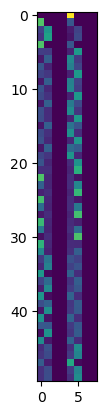

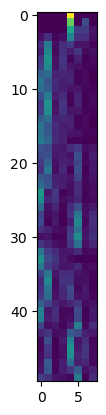

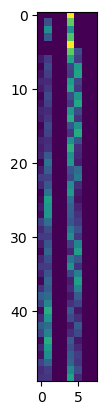

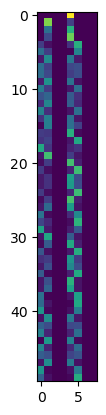

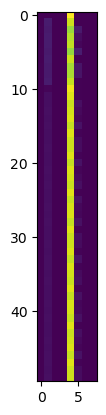

In [19]:
for i in range(5):
    plt.imshow(popsgreedy[i], interpolation='none')
    plt.show()

In [27]:
three_q_dms_greedy = get_3_qbit_dms(newdata_mmi,8,"c5","greedy")

In [28]:
three_q_dms_random = get_3_qbit_dms(newdata_mmi_random,8,"c5","random")

In [101]:
for time_step in twoQdmsgreedy[3]:
        mutual_info = measure.mutual_information_of_every_pair_dict(time_step)
        # Filter out values below the precision threshold
        filtered_mutual_info = {k: v if v >= 1e-8 else 0 for k, v in mutual_info.items()}
        #print(filtered_mutual_info)

In [102]:
for time_step in three_q_dms_greedy[3]:
        mmi = measure.monogamy_of_mutual_information_of_every_triplet_dict(time_step)
        # Filter out values below the precision threshold
        #filtered_mmi = {k: v if v >= 1e-8 else 0 for k, v in mmi.items()}
        print(mmi)

{(0, 1, 2): -0.033170510072071724, (0, 1, 3): -0.033170629281361275, (0, 1, 4): -0.10540635761922357, (0, 1, 5): -0.033170560596347265, (0, 1, 6): -0.033170441387057714, (0, 1, 7): -0.033170560596347265, (0, 2, 3): -0.033170748490650825, (0, 2, 4): -0.10540635761922357, (0, 2, 5): -0.03317020296847861, (0, 2, 6): -0.03317103743350547, (0, 2, 7): -0.03317008375918906, (0, 3, 4): -0.10540635761922357, (0, 3, 5): -0.03317032217776816, (0, 3, 6): -0.03317008375918906, (0, 3, 7): -0.033170560596347265, (0, 4, 5): -0.10540635761922357, (0, 4, 6): -0.10540659603780267, (0, 4, 7): -0.10540635761922357, (0, 5, 6): -0.03316956916006342, (0, 5, 7): -0.03316992678793207, (0, 6, 7): -0.03316956916006342, (1, 2, 3): -0.03317039086278217, (1, 2, 4): -0.10540635761922357, (1, 2, 5): -0.033170560596347265, (1, 2, 6): -0.033170560596347265, (1, 2, 7): -0.03317032217776816, (1, 3, 4): -0.10540635761922357, (1, 3, 5): -0.03317020296847861, (1, 3, 6): -0.033170799014926367, (1, 3, 7): -0.033170560596347265

In [103]:
for time_step in three_q_dms_greedy[3]:
        ssa = measure.strong_subaddativity_of_every_triplet_dict(time_step)
        # Filter out values below the precision threshold
        #filtered_mutual_info = {k: v if v >= 1e-8 else 0 for k, v in mutual_info.items()}
        print(ssa)


{(0, 1, 2): 0.5577040614890811, (0, 1, 3): 0.5577040614890811, (0, 1, 4): 0.39758630238200965, (0, 1, 5): 0.5577040832067117, (0, 1, 6): 0.5577040832067117, (0, 1, 7): 0.5577040832067117, (0, 2, 3): 0.5577040614890811, (0, 2, 4): 0.39758630238200965, (0, 2, 5): 0.5577040832067117, (0, 2, 6): 0.5577040832067117, (0, 2, 7): 0.5577040832067117, (0, 3, 4): 0.39758630238200965, (0, 3, 5): 0.5577040832067117, (0, 3, 6): 0.5577040832067117, (0, 3, 7): 0.5577040832067117, (0, 4, 5): 1.3862890753667956, (0, 4, 6): 1.3862890753667956, (0, 4, 7): 1.3862890753667956, (0, 5, 6): 0.5577036516960505, (0, 5, 7): 0.5577036516960505, (0, 6, 7): 0.5577036516960505, (1, 2, 3): 0.5577040614890811, (1, 2, 4): 0.39758630238200965, (1, 2, 5): 0.5577040832067117, (1, 2, 6): 0.5577040832067117, (1, 2, 7): 0.5577040832067117, (1, 3, 4): 0.39758630238200965, (1, 3, 5): 0.5577040832067117, (1, 3, 6): 0.5577040832067117, (1, 3, 7): 0.5577040832067117, (1, 4, 5): 1.3862890753667956, (1, 4, 6): 1.3862890753667956, (1

In [29]:
for time_step in twoQdmsgreedy[3]:
        conc = measure.concurrence_of_every_pair_dict(time_step)
        # Filter out values below the precision threshold
        filtered_conc = {k: v if v > 0 else 0 for k, v in conc.items()}
        print(filtered_conc)

{(0, 1): 0, (0, 2): 0, (0, 3): 0, (0, 4): 0, (0, 5): 0, (0, 6): 0, (0, 7): 0, (1, 2): 0, (1, 3): 0, (1, 4): 0, (1, 5): 0, (1, 6): 0, (1, 7): 0, (2, 3): 0, (2, 4): 0, (2, 5): 0, (2, 6): 0, (2, 7): 0, (3, 4): 0, (3, 5): 0, (3, 6): 0, (3, 7): 0, (4, 5): 0, (4, 6): 0, (4, 7): 0, (5, 6): 0, (5, 7): 0, (6, 7): 0}
{(0, 1): 0, (0, 2): 0, (0, 3): 0, (0, 4): 0, (0, 5): 0, (0, 6): 0, (0, 7): 0, (1, 2): 0, (1, 3): 0, (1, 4): (0.23393213748931885-4.820349414763614e-12j), (1, 5): 0, (1, 6): 0, (1, 7): 0, (2, 3): 0, (2, 4): 0, (2, 5): 0, (2, 6): 0, (2, 7): 0, (3, 4): 0, (3, 5): 0, (3, 6): 0, (3, 7): 0, (4, 5): 0, (4, 6): 0, (4, 7): 0, (5, 6): 0, (5, 7): 0, (6, 7): 0}
{(0, 1): 0, (0, 2): 0, (0, 3): 0, (0, 4): 0, (0, 5): 0, (0, 6): 0, (0, 7): 0, (1, 2): 0, (1, 3): 0, (1, 4): (0.3217940926551819-3.0816755397511386e-11j), (1, 5): 0, (1, 6): 0, (1, 7): 0, (2, 3): 0, (2, 4): 0, (2, 5): 0, (2, 6): 0, (2, 7): 0, (3, 4): 0, (3, 5): 0, (3, 6): 0, (3, 7): 0, (4, 5): 0, (4, 6): 0, (4, 7): 0, (5, 6): 0, (5, 7): 0

In [33]:
for time_step in twoQdmsrandom[3]:
        conc = measure.concurrence_of_every_pair_dict(time_step)
        # Filter out values below the precision threshold
        filtered_conc = {k: v if v > 0 else 0 for k, v in conc.items()}
        print(filtered_conc)

{(0, 1): 0, (0, 2): 0, (0, 3): 0, (0, 4): 0, (0, 5): 0, (0, 6): 0, (0, 7): 0, (1, 2): 0, (1, 3): 0, (1, 4): 0, (1, 5): 0, (1, 6): 0, (1, 7): 0, (2, 3): 0, (2, 4): 0, (2, 5): 0, (2, 6): 0, (2, 7): 0, (3, 4): 0, (3, 5): 0, (3, 6): 0, (3, 7): 0, (4, 5): 0, (4, 6): 0, (4, 7): 0, (5, 6): 0, (5, 7): 0, (6, 7): 0}
{(0, 1): 0, (0, 2): 0, (0, 3): 0, (0, 4): 0, (0, 5): 0, (0, 6): 0, (0, 7): 0, (1, 2): 0, (1, 3): 0, (1, 4): (0.23393213748931885-4.820349414763614e-12j), (1, 5): 0, (1, 6): 0, (1, 7): 0, (2, 3): 0, (2, 4): 0, (2, 5): 0, (2, 6): 0, (2, 7): 0, (3, 4): 0, (3, 5): 0, (3, 6): 0, (3, 7): 0, (4, 5): 0, (4, 6): 0, (4, 7): 0, (5, 6): 0, (5, 7): 0, (6, 7): 0}
{(0, 1): 0, (0, 2): 0, (0, 3): 0, (0, 4): 0, (0, 5): 0, (0, 6): 0, (0, 7): 0, (1, 2): 0, (1, 3): (0.16614243388175964+3.510156401653752e-11j), (1, 4): 0, (1, 5): (0.0360623374581337+1.257292325806958e-10j), (1, 6): 0, (1, 7): 0, (2, 3): 0, (2, 4): 0, (2, 5): 0, (2, 6): 0, (2, 7): 0, (3, 4): (0.0064170509576797485+2.2229600105116987e-10j)

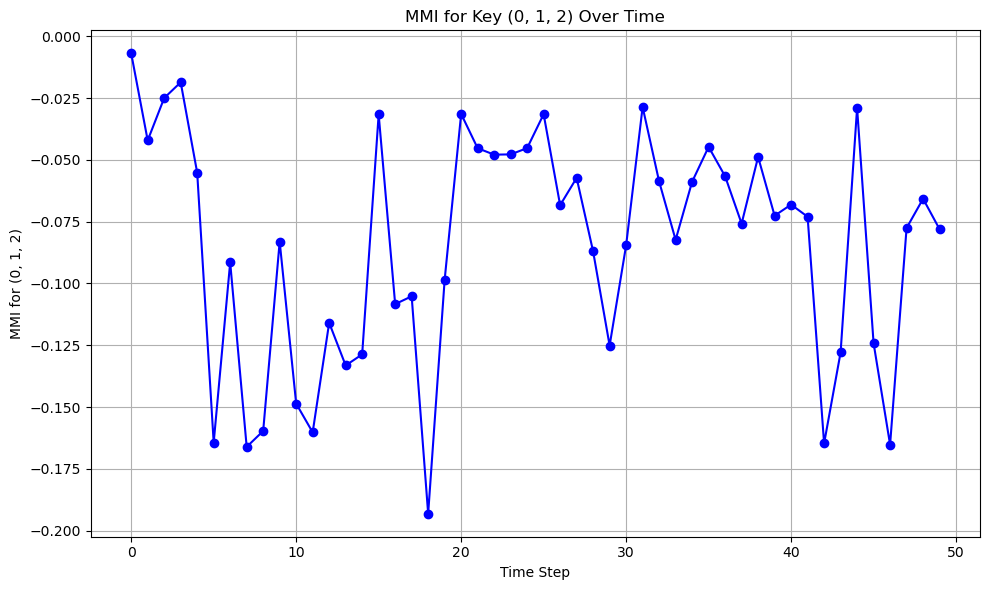

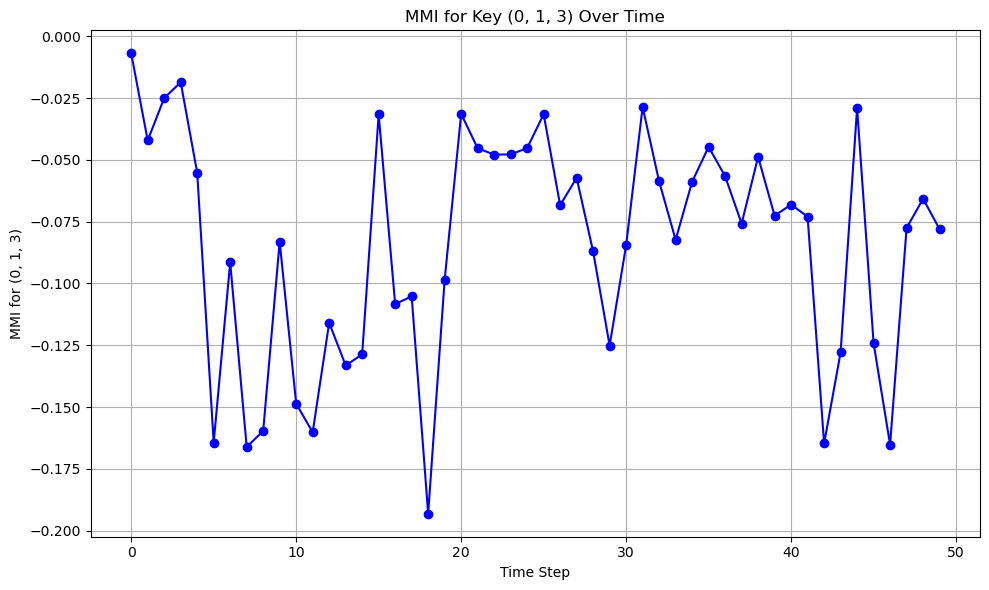

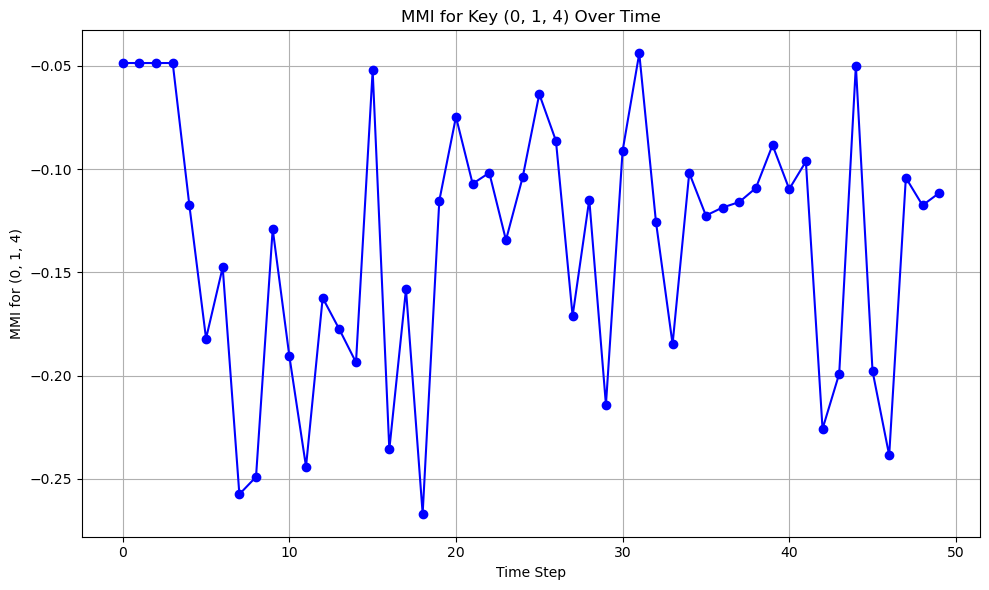

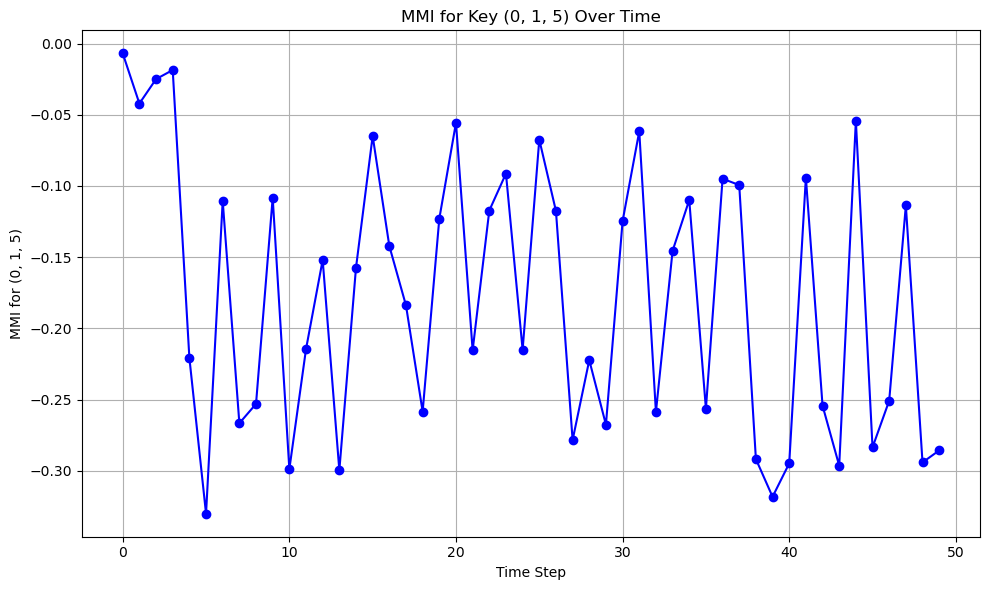

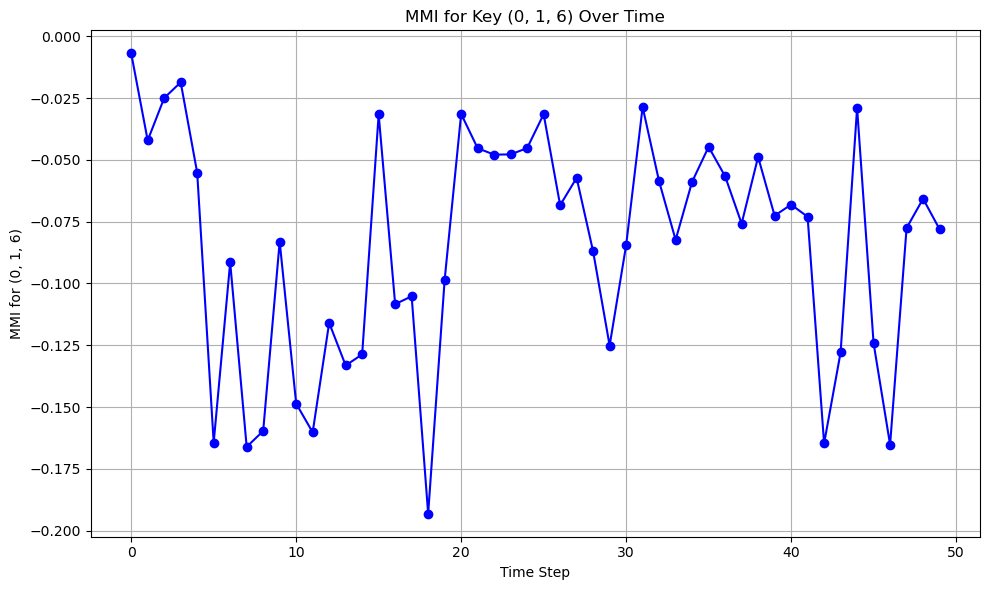

...

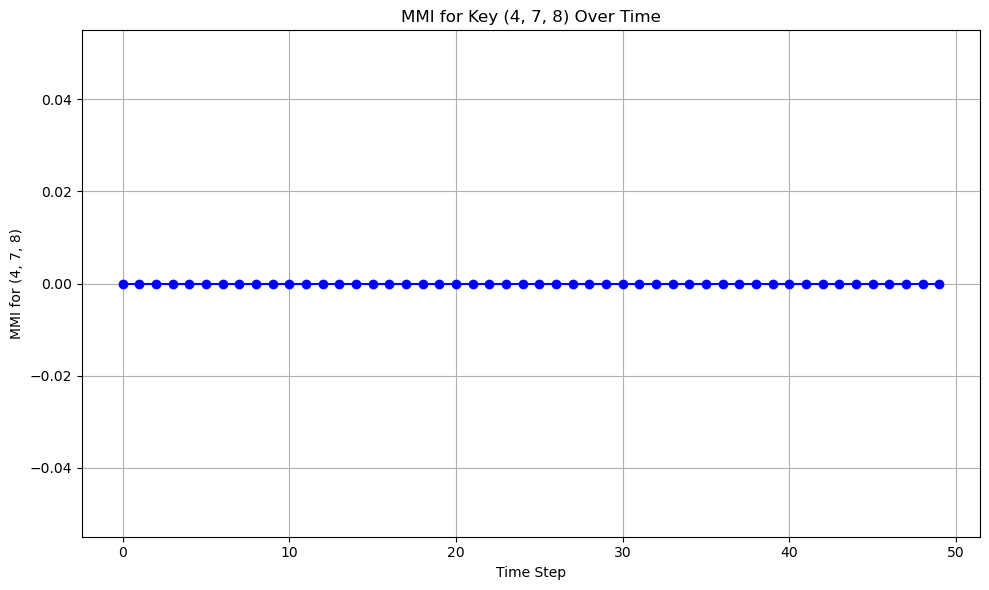

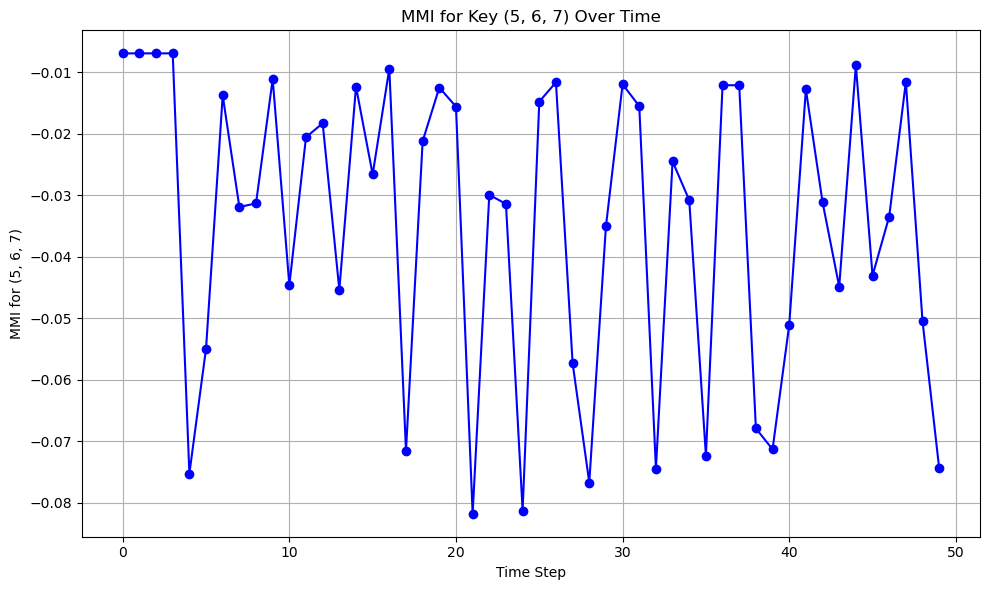

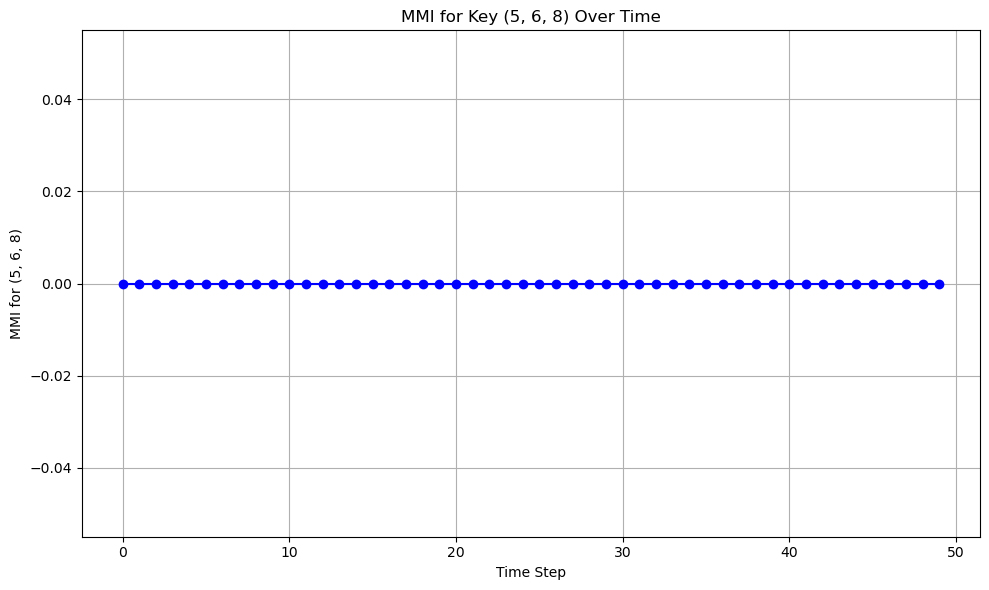

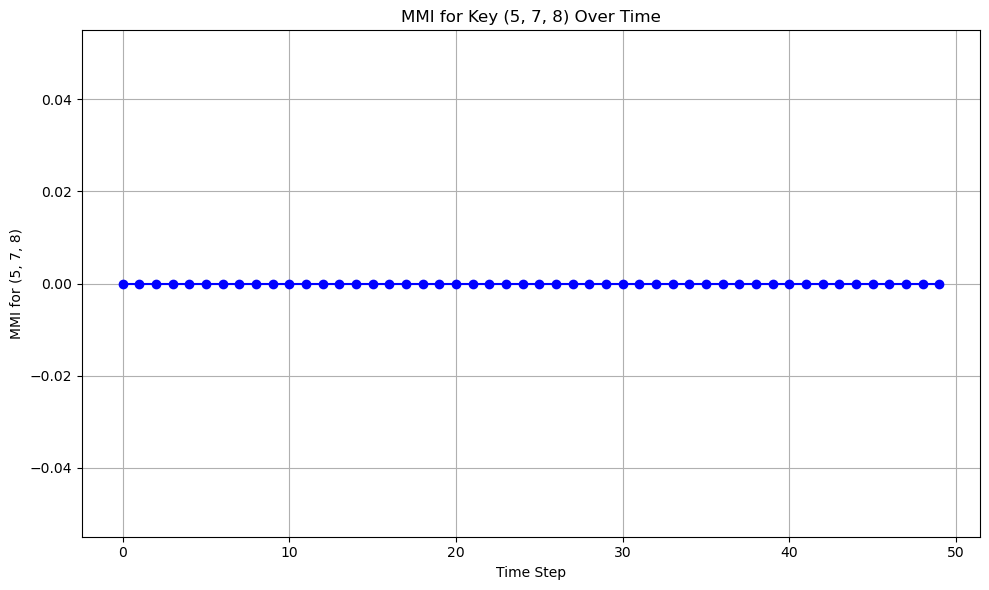

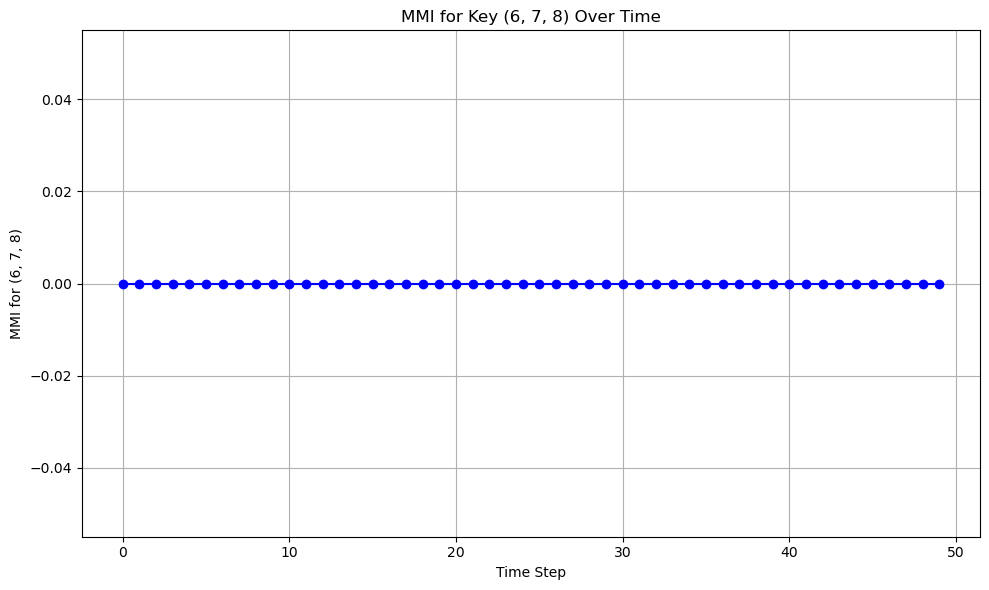

In [34]:
def plot_triplet_mmi(three_q_dms_greedy, triplet,trial_index):
    # Initialize lists to store time steps and corresponding values for the given triplet
    time_steps = []
    values_triplet = []

    # Loop through each time_step in the sim_index
    for time_step_idx, time_step in enumerate(three_q_dms_greedy[trial_index]):
        mmi = measure.monogamy_of_mutual_information_of_every_triplet_dict(time_step)
        
        # Get the value for the specific triplet
        value_triplet = mmi.get(triplet, 0)
        
        # Append the time step and value to the lists
        time_steps.append(time_step_idx)
        values_triplet.append(value_triplet)

    # Plot the values on an x-y plot
    plt.figure(figsize=(10, 6))
    plt.plot(time_steps, values_triplet, marker='o', linestyle='-', color='b')
    plt.xlabel('Time Step')
    plt.ylabel(f'MMI for {triplet}')
    plt.title(f'MMI for Key {triplet} Over Time')
    plt.grid(True)
    plt.tight_layout()
    plt.show()



# Loop through all triplet combinations between 0 and 8
for q1 in range(9):
    for q2 in range(q1 + 1, 9):
        for q3 in range(q2 + 1, 9):
            plot_triplet_mmi(three_q_dms_greedy, (q1, q2, q3),3)

/var/folders/x8/hv6lnsx5209d4m84b842j095n23ctf/T/ipykernel_50883/1191826003.py:37: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


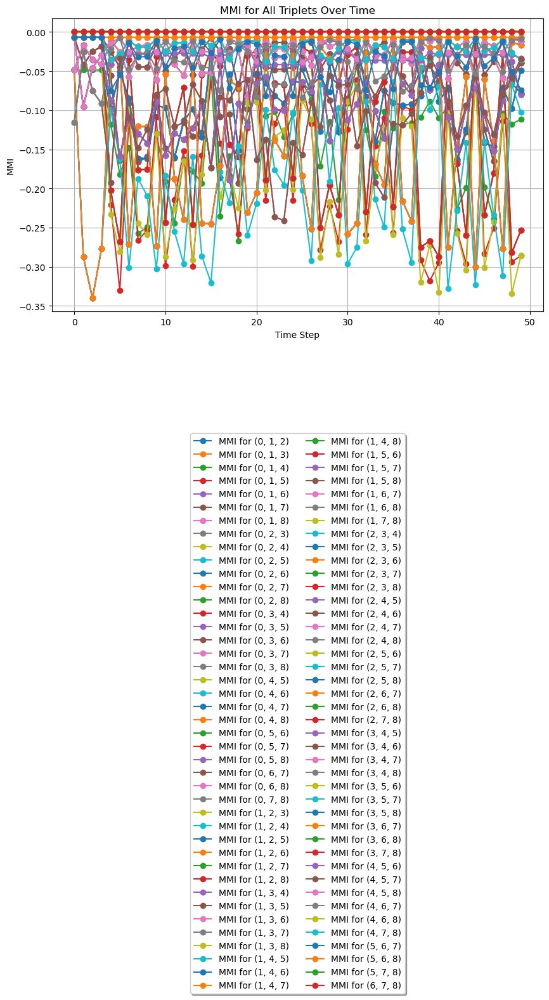

In [59]:
def plot_triplet_mmi(three_q_dms_greedy, triplet,trial_index, ax):
    # Initialize lists to store time steps and corresponding values for the given triplet
    time_steps = []
    values_triplet = []

    # Loop through each time_step in the sim_index
    for time_step_idx, time_step in enumerate(three_q_dms_greedy[trial_index]):
        mmi = measure.monogamy_of_mutual_information_of_every_triplet_dict(time_step)
        
        # Get the value for the specific triplet
        value_triplet = mmi.get(triplet, 0)
        
        # Append the time step and value to the lists
        time_steps.append(time_step_idx)
        values_triplet.append(value_triplet)

# Plot the values on the provided axes
    ax.plot(time_steps, values_triplet, marker='o', linestyle='-', label=f'MMI for {triplet}')

# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Loop through all triplet combinations between 0 and 8
for q1 in range(9):
    for q2 in range(q1 + 1, 9):
        for q3 in range(q2 + 1, 9):
            plot_triplet_mmi(three_q_dms_greedy, (q1, q2, q3),3, ax)

# Set labels, title, legend, and grid
ax.set_xlabel('Time Step')
ax.set_ylabel('MMI')
ax.set_title('MMI for All Triplets Over Time')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), shadow=True, ncol=2)
ax.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

/var/folders/x8/hv6lnsx5209d4m84b842j095n23ctf/T/ipykernel_50883/2048856410.py:37: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


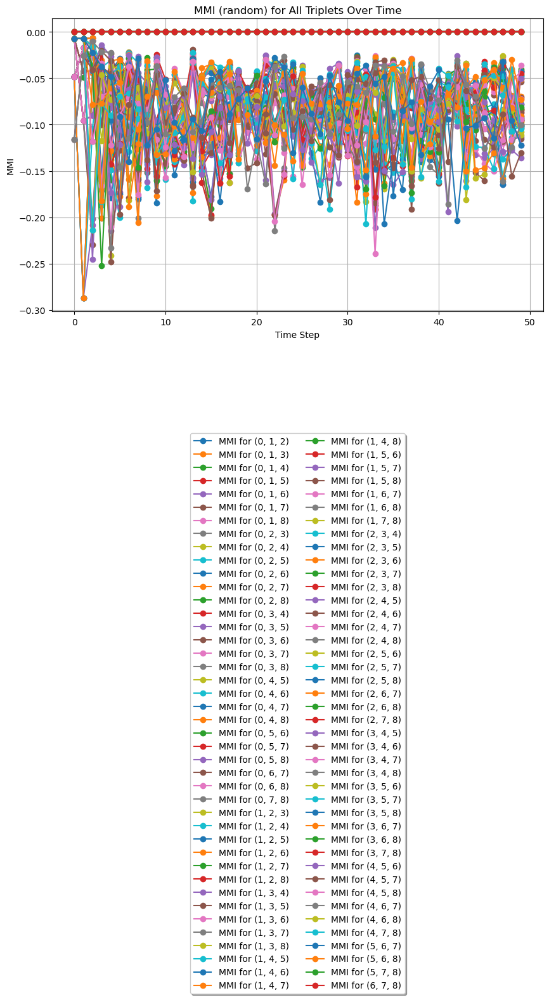

In [57]:
def plot_triplet_mmi(three_q_dms_random, triplet,trial_index, ax):
    # Initialize lists to store time steps and corresponding values for the given triplet
    time_steps = []
    values_triplet = []

    # Loop through each time_step in the sim_index
    for time_step_idx, time_step in enumerate(three_q_dms_random[trial_index]):
        mmi = measure.monogamy_of_mutual_information_of_every_triplet_dict(time_step)
        
        # Get the value for the specific triplet
        value_triplet = mmi.get(triplet, 0)
        
        # Append the time step and value to the lists
        time_steps.append(time_step_idx)
        values_triplet.append(value_triplet)

# Plot the values on the provided axes
    ax.plot(time_steps, values_triplet, marker='o', linestyle='-', label=f'MMI for {triplet}')

# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Loop through all triplet combinations between 0 and 8
for q1 in range(9):
    for q2 in range(q1 + 1, 9):
        for q3 in range(q2 + 1, 9):
            plot_triplet_mmi(three_q_dms_random, (q1, q2, q3),3, ax)

# Set labels, title, legend, and grid
ax.set_xlabel('Time Step')
ax.set_ylabel('MMI')
ax.set_title('MMI (random) for All Triplets Over Time')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), shadow=True, ncol=2)
ax.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

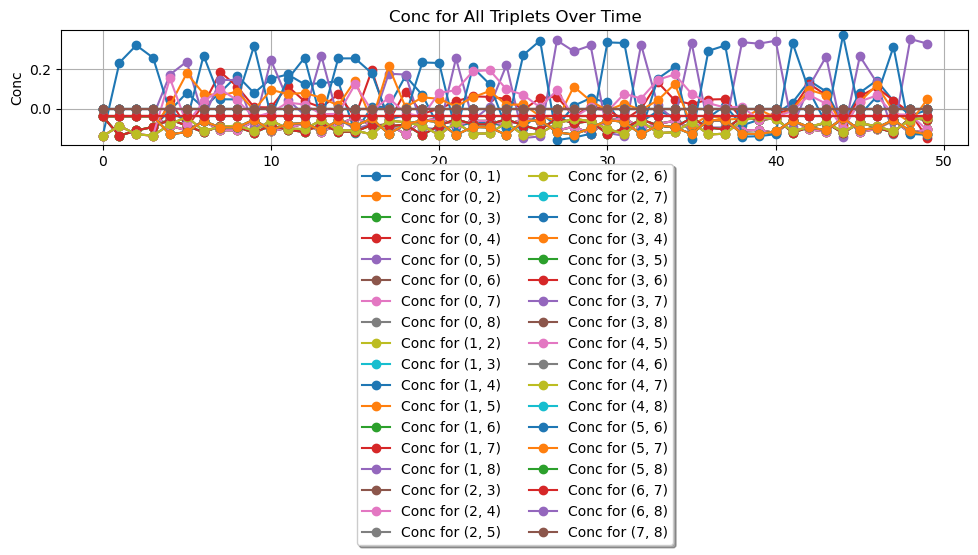

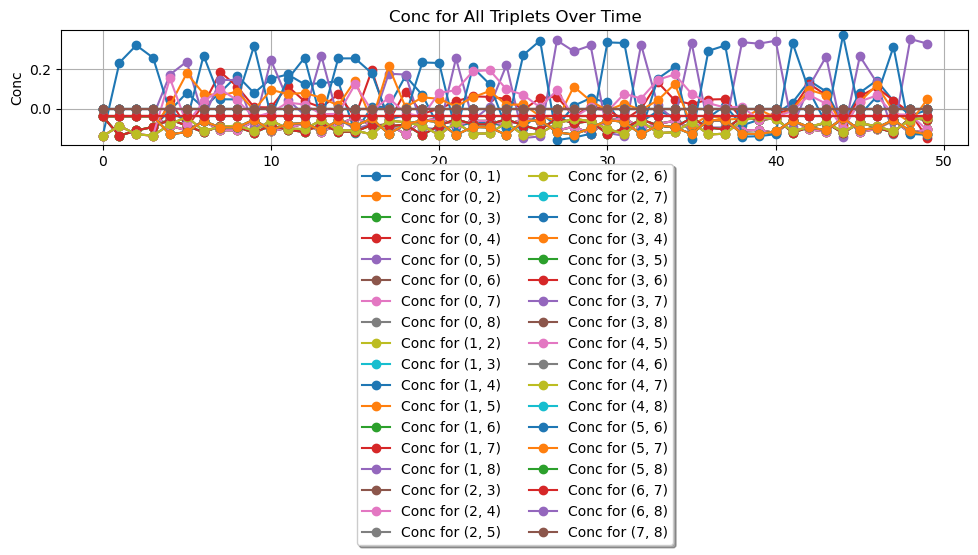

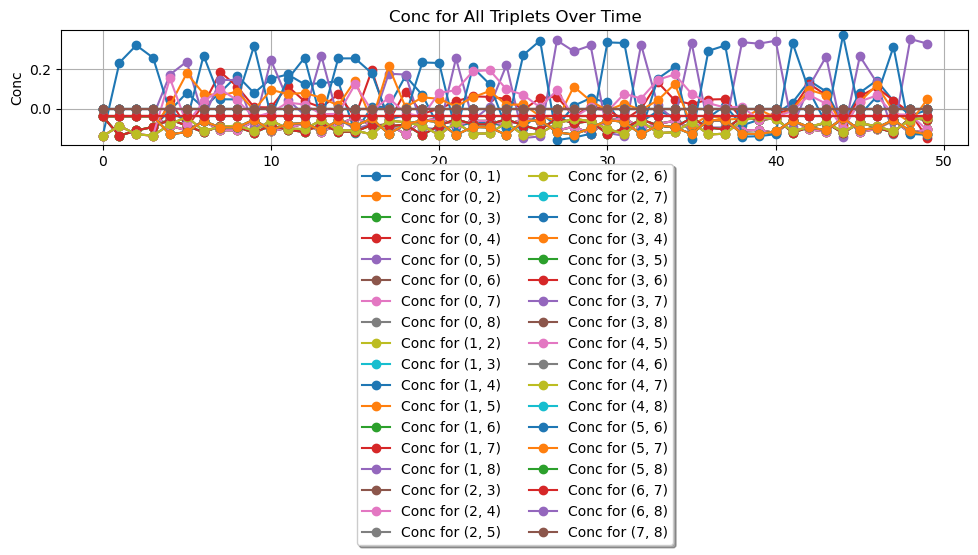

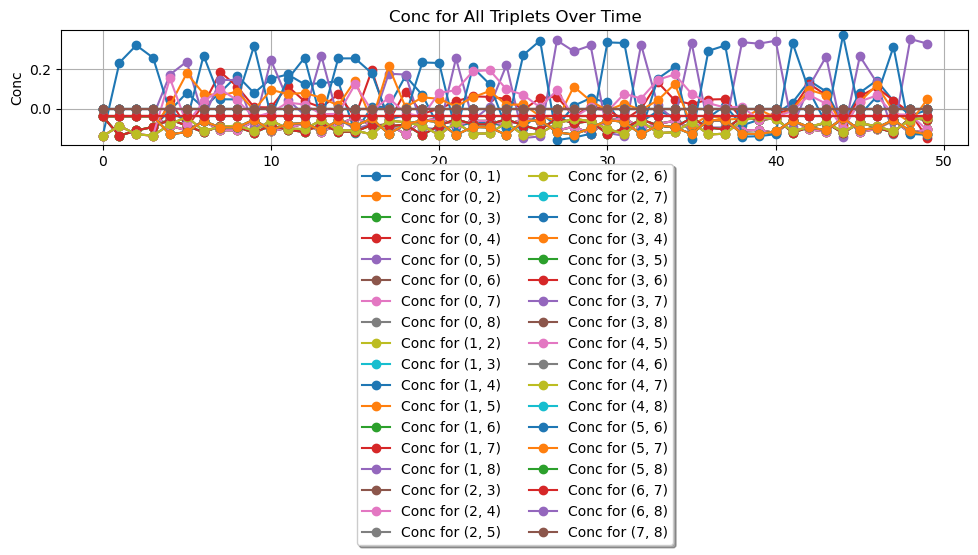

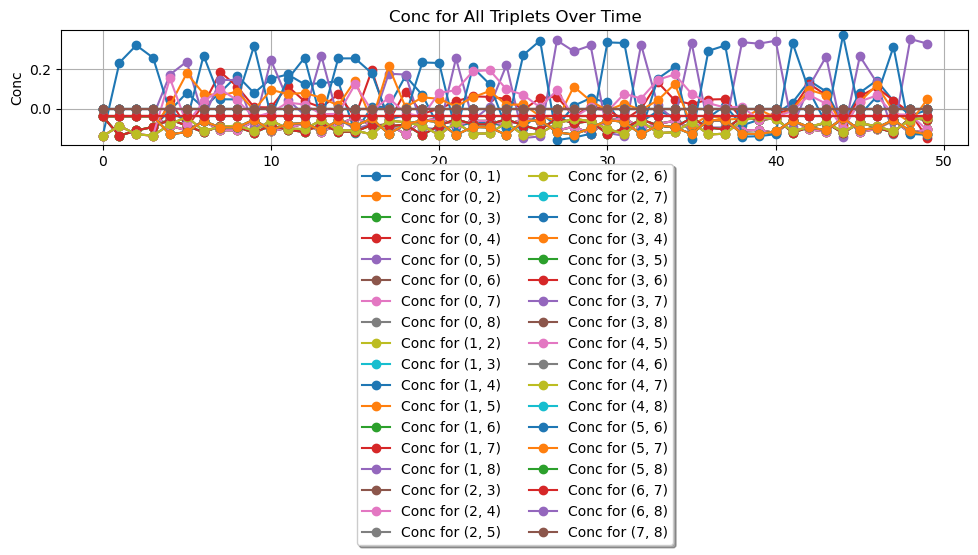

In [44]:
def plot_conc_all_doublet(twoQdmsgreedy, doublet,trial_index, ax):
    # Initialize lists to store time steps and corresponding values for the given triplet
    time_steps = []
    values_doublet = []

    # Loop through each time_step in the sim_index
    for time_step_idx, time_step in enumerate(twoQdmsgreedy[trial_index]):
        conc = measure.concurrence_of_every_pair_dict(time_step)
        
        # Get the value for the specific triplet
        value_doublet = conc.get(doublet, 0)
        
        # Append the time step and value to the lists
        time_steps.append(time_step_idx)
        values_doublet.append(value_doublet)

# Plot the values on the provided axes
    ax.plot(time_steps, values_doublet, marker='o', linestyle='-', label=f'Conc for {doublet}')

for trial_index in range(5):

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Loop through all triplet combinations between 0 and 8
    for q1 in range(9):
        for q2 in range(q1 + 1, 9):
                plot_conc_all_doublet(twoQdmsgreedy, (q1, q2),3, ax)
    
    # Set labels, title, legend, and grid
    ax.set_xlabel('Time Step')
    ax.set_ylabel('Conc')
    ax.set_title('Conc for All Triplets Over Time')
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), shadow=True, ncol=2)
    ax.grid(True)
    
    # Show the plot
    plt.tight_layout()
    plt.show()

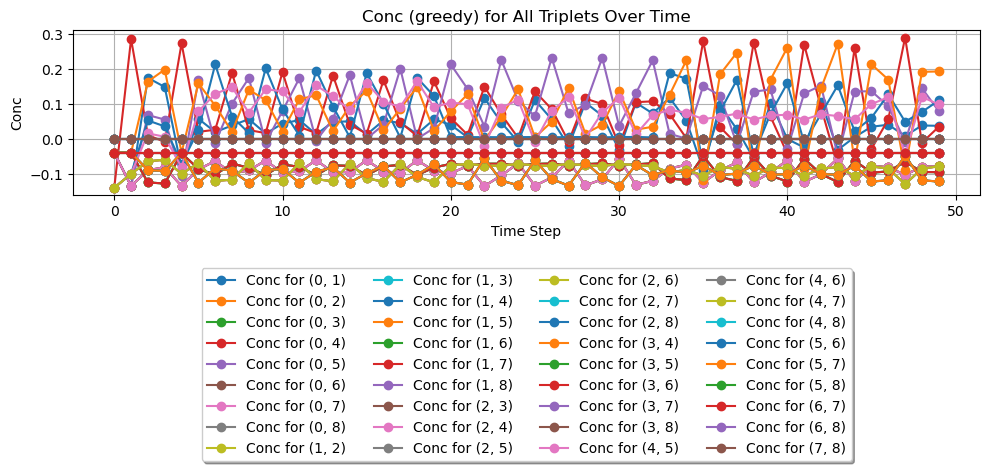

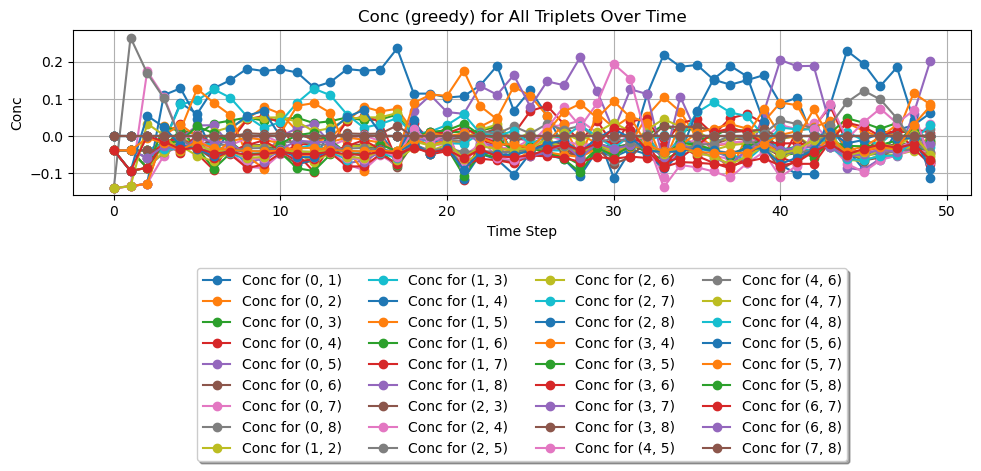

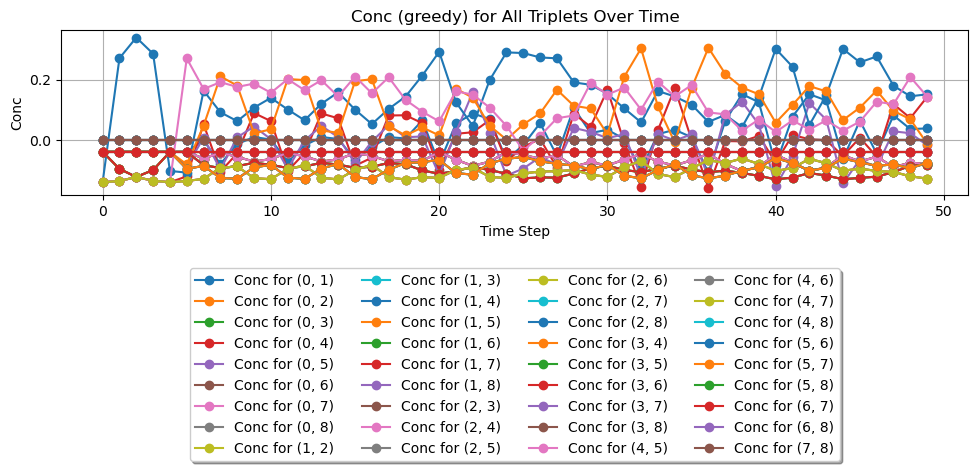

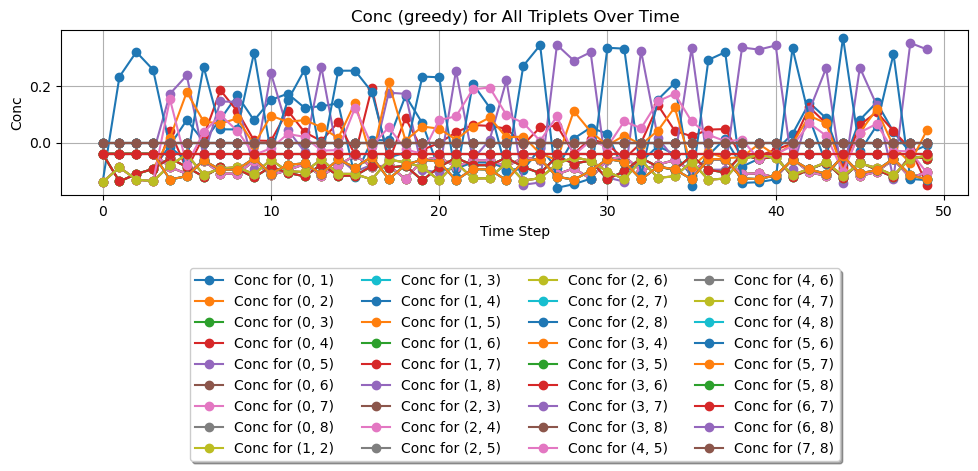

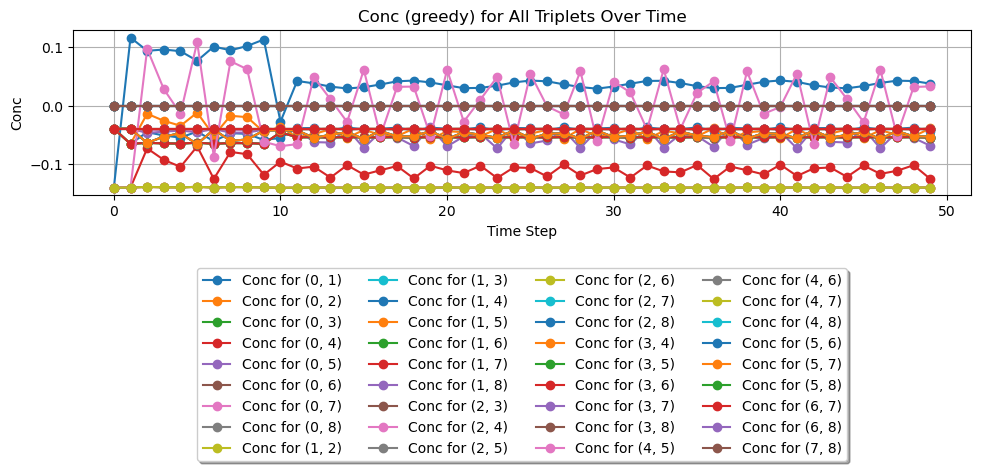

In [54]:
for trial_index in range(5):

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Loop through all triplet combinations between 0 and 8
    for q1 in range(9):
        for q2 in range(q1 + 1, 9):
                plot_conc_all_doublet(twoQdmsgreedy, (q1, q2),trial_index, ax)
    
    # Set labels, title, legend, and grid
    ax.set_xlabel('Time Step')
    ax.set_ylabel('Conc')
    ax.set_title('Conc (greedy) for All Triplets Over Time')
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), shadow=True, ncol=4)
    ax.grid(True)
    
    # Show the plot
    plt.tight_layout()
    plt.show()

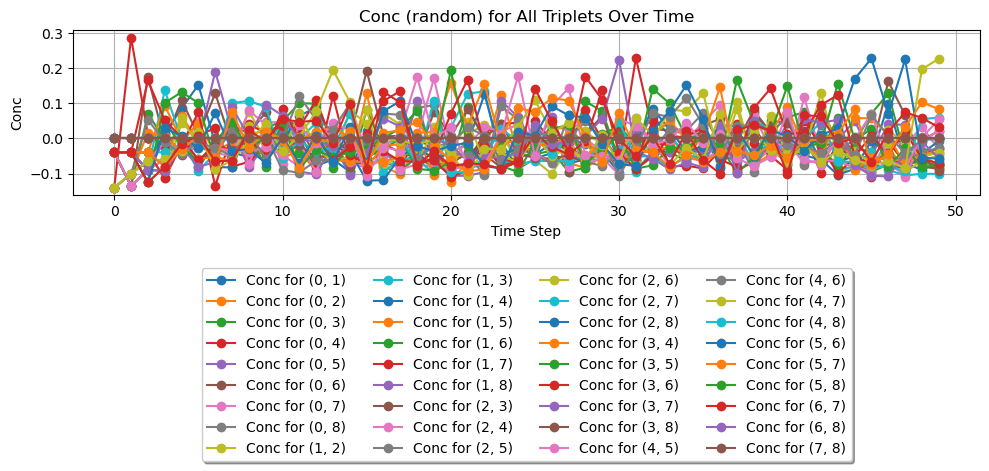

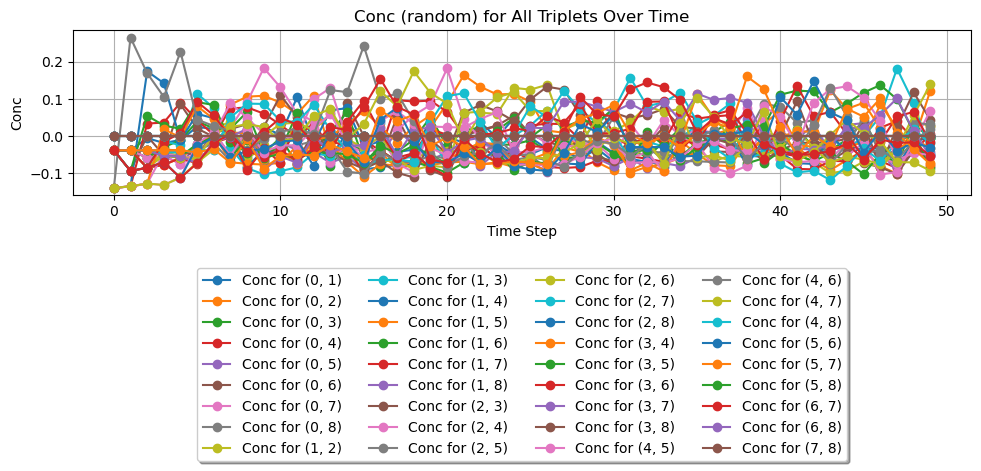

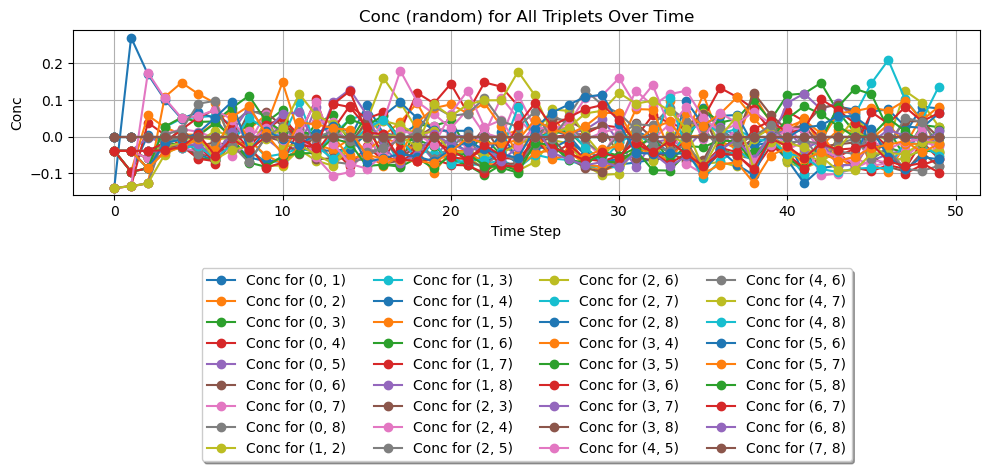

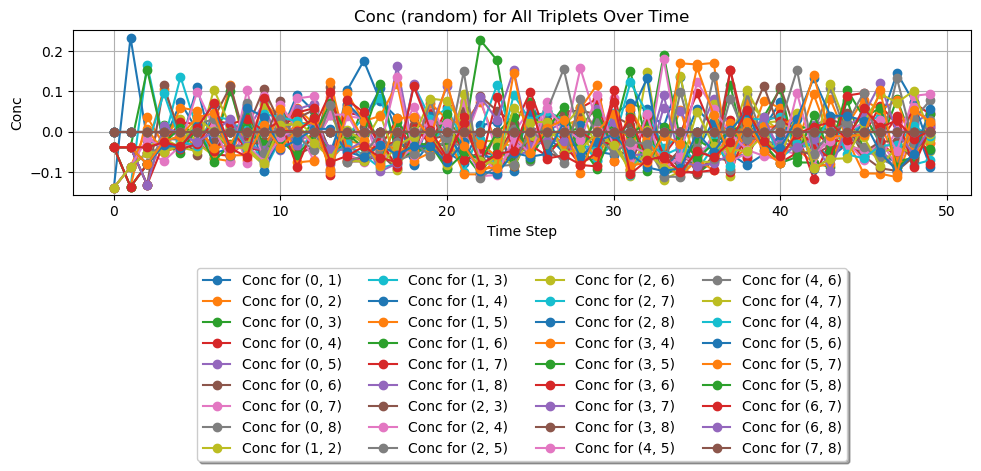

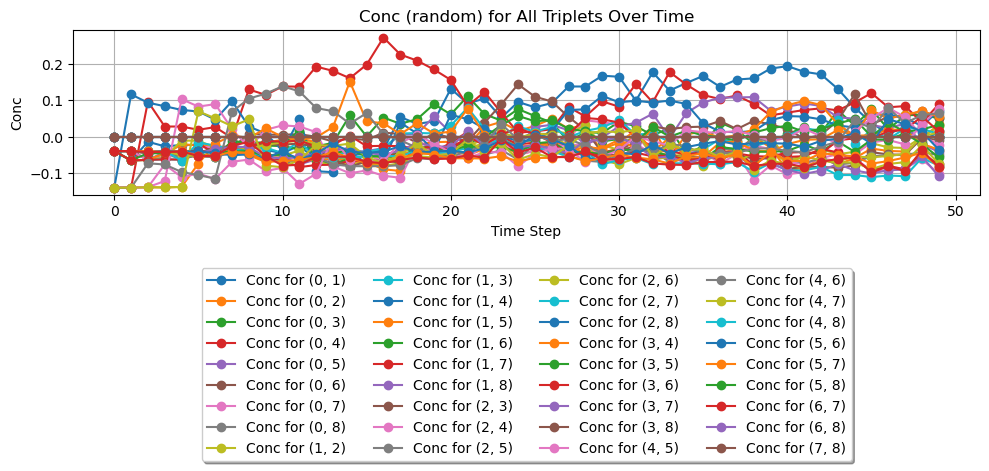

In [56]:
for trial_index in range(5):

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Loop through all triplet combinations between 0 and 8
    for q1 in range(9):
        for q2 in range(q1 + 1, 9):
                plot_conc_all_doublet(twoQdmsrandom, (q1, q2),trial_index, ax)
    
    # Set labels, title, legend, and grid
    ax.set_xlabel('Time Step')
    ax.set_ylabel('Conc')
    ax.set_title('Conc (random) for All Triplets Over Time')
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), shadow=True, ncol=4)
    ax.grid(True)
    
    # Show the plot
    plt.tight_layout()
    plt.savefig(f'plotnumrandom_{trial_index}.png')   # save the figure to file
    plt.show()

/var/folders/x8/hv6lnsx5209d4m84b842j095n23ctf/T/ipykernel_50883/3675773592.py:20: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


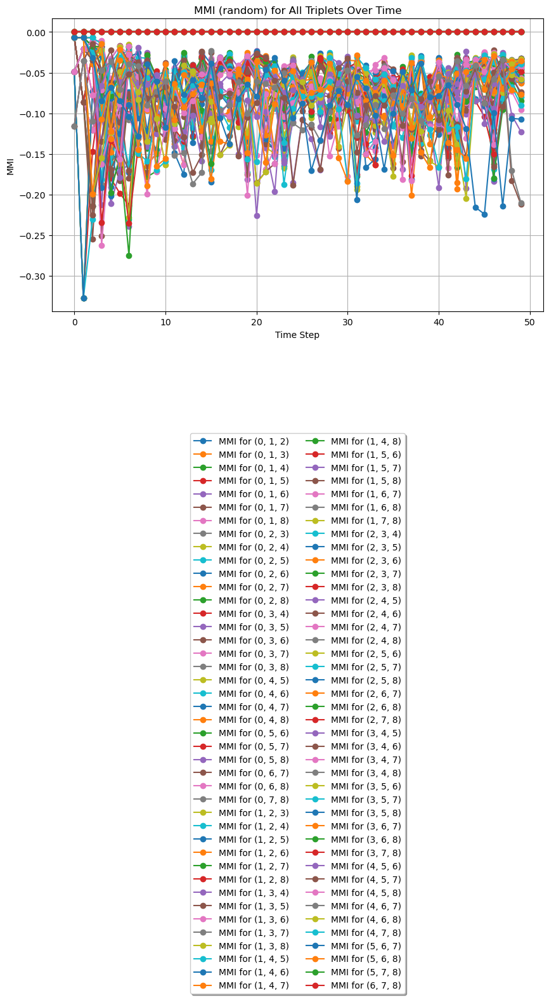

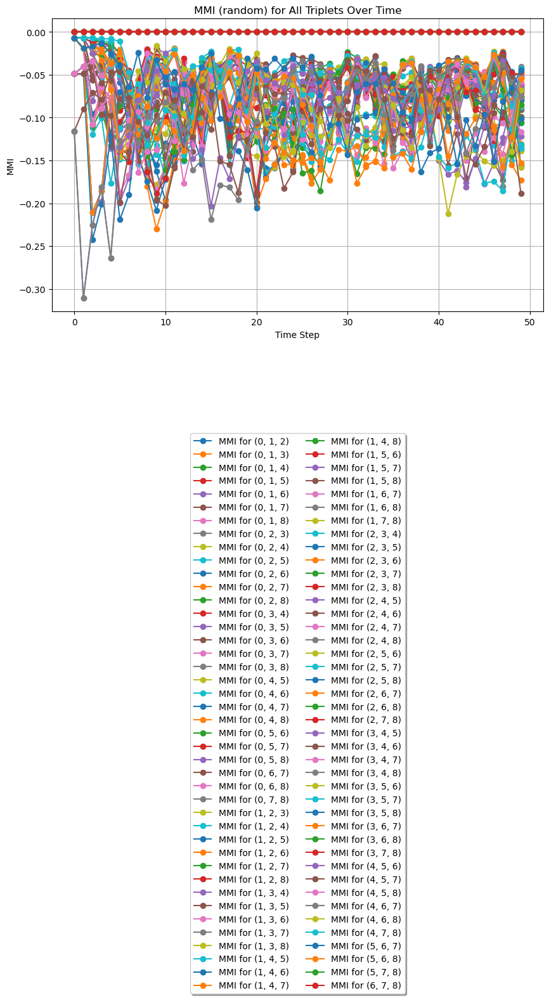

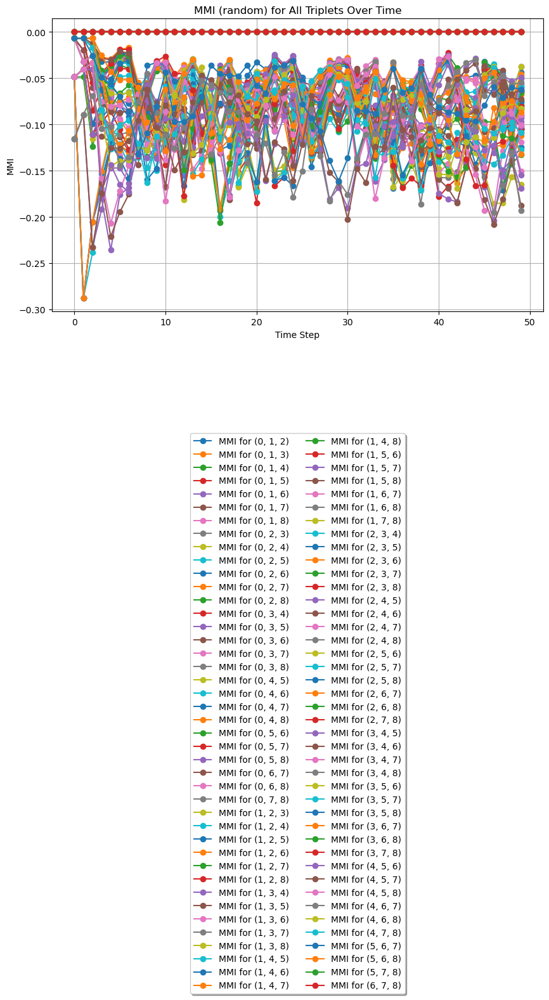

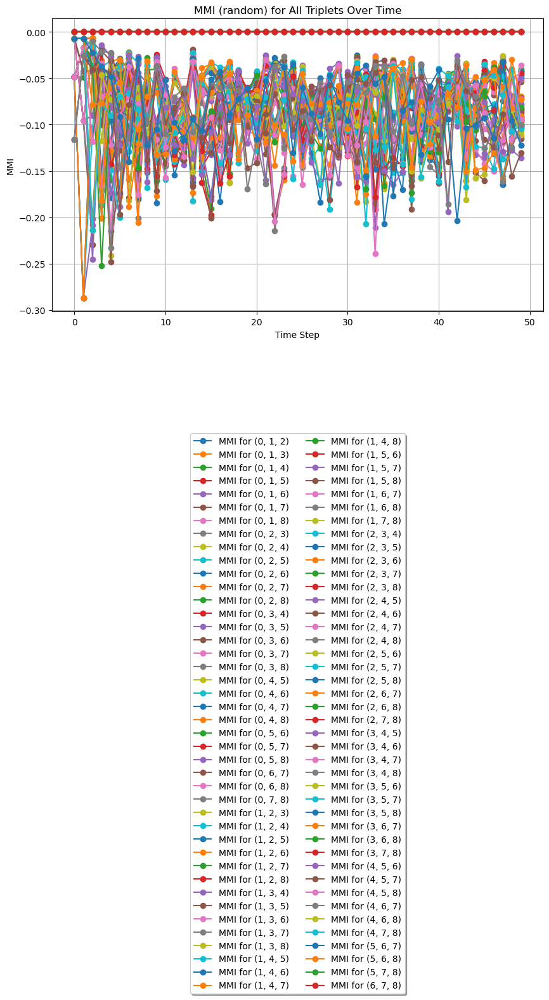

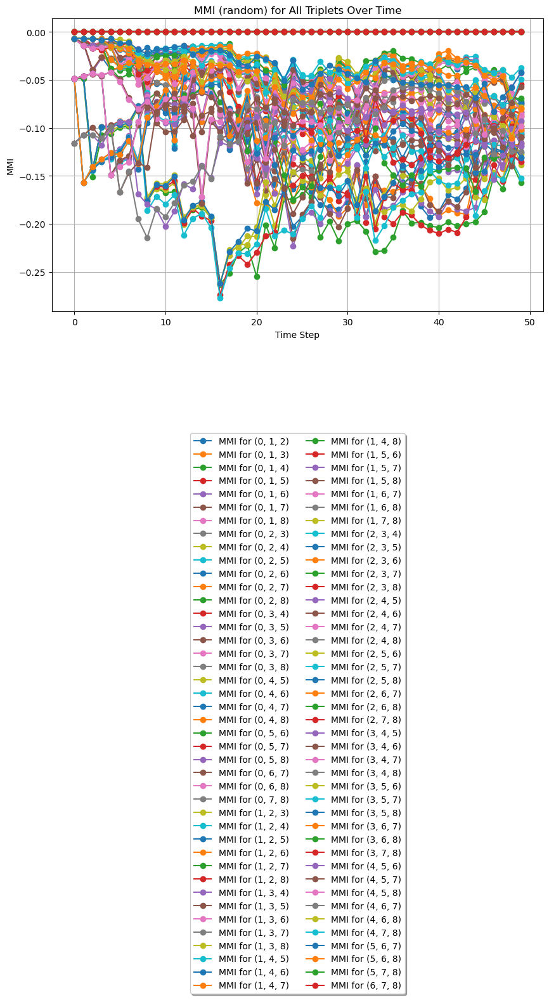

In [63]:
for trial_index in range(5):

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Loop through all triplet combinations between 0 and 8
    for q1 in range(9):
        for q2 in range(q1 + 1, 9):
            for q3 in range(q2 + 1, 9):
                plot_triplet_mmi(three_q_dms_random, (q1, q2, q3),trial_index, ax)
    
    # Set labels, title, legend, and grid
    ax.set_xlabel('Time Step')
    ax.set_ylabel('MMI')
    ax.set_title('MMI (random) for All Triplets Over Time')
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), shadow=True, ncol=2)
    ax.grid(True)
    
    # Show the plot
    plt.tight_layout()
    plt.savefig(f'MMIrandom_{trial_index}.png')   # save the figure to file
    plt.show()

/var/folders/x8/hv6lnsx5209d4m84b842j095n23ctf/T/ipykernel_50883/2372969588.py:20: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


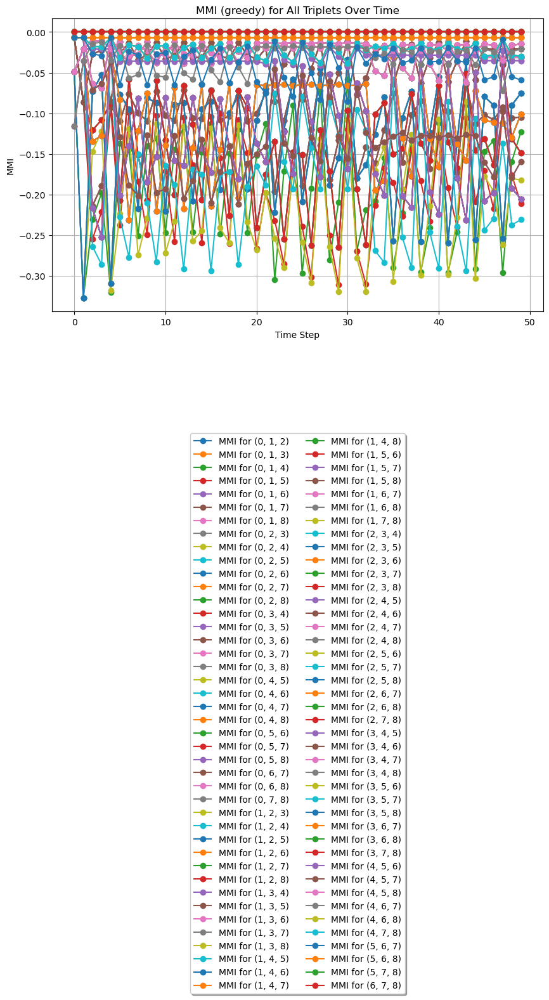

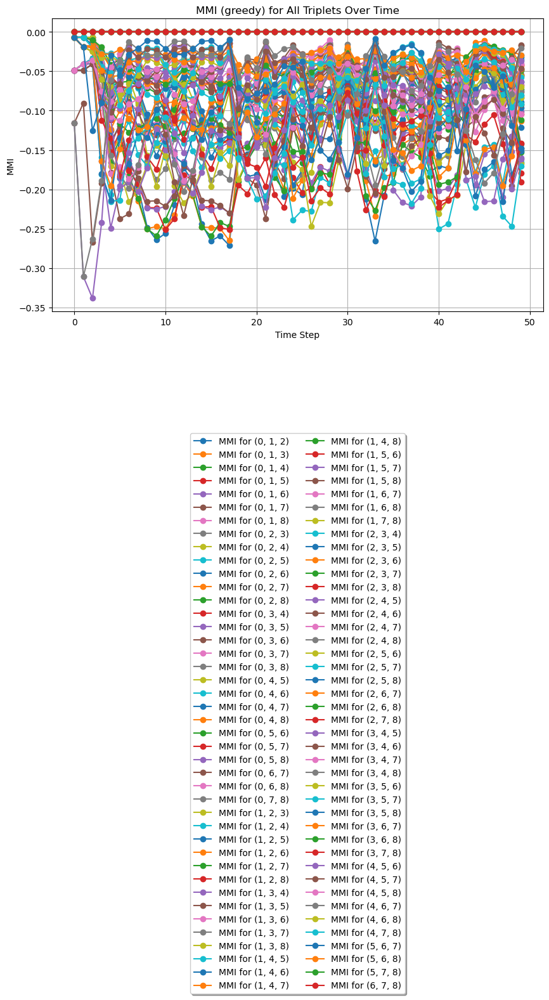

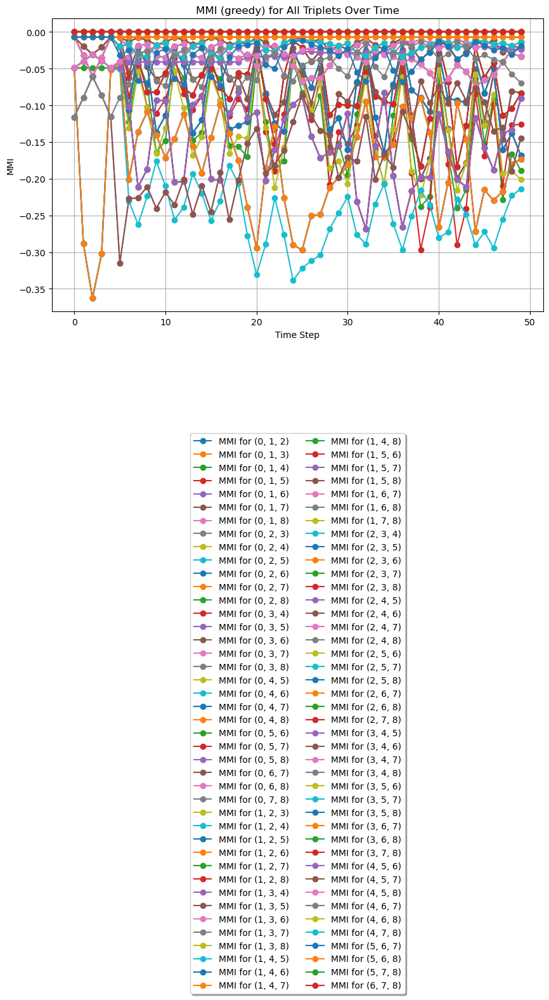

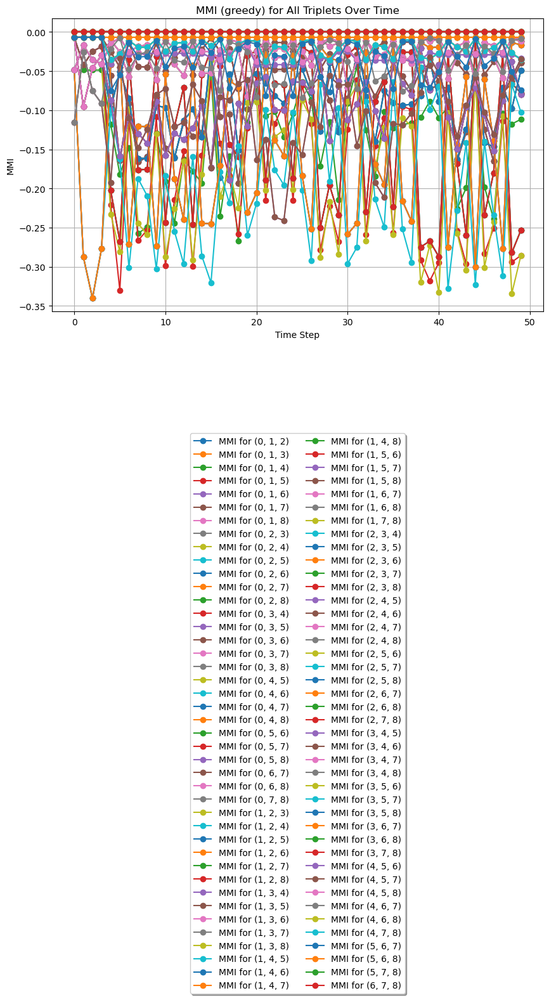

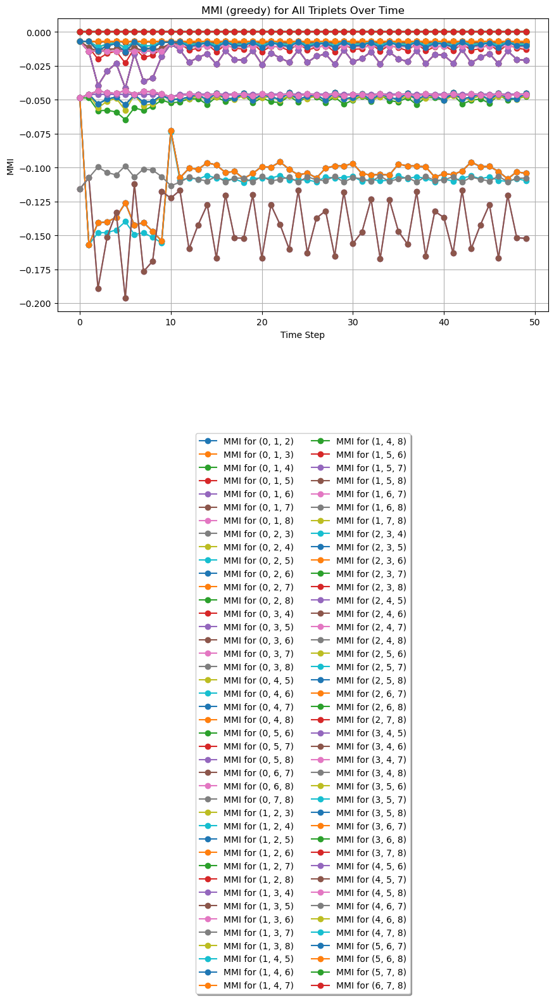

In [64]:
for trial_index in range(5):

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Loop through all triplet combinations between 0 and 8
    for q1 in range(9):
        for q2 in range(q1 + 1, 9):
            for q3 in range(q2 + 1, 9):
                plot_triplet_mmi(three_q_dms_greedy, (q1, q2, q3),trial_index, ax)
    
    # Set labels, title, legend, and grid
    ax.set_xlabel('Time Step')
    ax.set_ylabel('MMI')
    ax.set_title('MMI (greedy) for All Triplets Over Time')
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), shadow=True, ncol=2)
    ax.grid(True)
    
    # Show the plot
    plt.tight_layout()
    plt.savefig(f'MMIgreedy_{trial_index}.png')   # save the figure to file
    plt.show()